In [1]:
import numpy as np
from matplotlib import pyplot as plt

from astropy.io import fits
from astropy.modeling import models, fitting
from photutils.centroids import centroid_com
from photutils.aperture import CircularAperture
from photutils.aperture import aperture_photometry

%matplotlib inline
#%config InlineBackend.figure_format='retina'
#!pip install git+https://github.com/M-Bianchi/My_matplotlib_style
plt.style.use('mystyle')
plt.rcParams['axes.grid'] = False

In [2]:
# Function to open the fits file and plot them
def Open_Fits(filepath, plot, cmap='gnuplot2'):
    file_temp = fits.open(filepath)
    file = file_temp[0].data
    file_temp.close()
    if plot == True:
        plt.imshow(file, clim=(0, np.quantile(file, [0.99])), cmap=cmap, origin='lower')
        plt.colorbar(fraction=0.0375, pad=0.02);
    return file

$m_\text{physical} = \text{ZP} + m_\text{instrument}$

$-2.5 \log_{10} f_\lambda = \text{ZP} - 2.5 \log_{10} R[e^-/s] \:\:\: \Longrightarrow \:\:\: f_\lambda [erg/s/cm^2/\AA] = 10^{-0.4 \text{ZP}} R[e^-/s]$ 

In order to obtain ZP, we have to estimate $m_\text{physical}$ from calibration stars. We use the SDSS catalogue.

TOBI_ha = SDSS_r -0.2568 * (SDSS_g-SDSS_r) + 0.1470

TOBI_hb =  SDSS_g -0.2322 * (SDSS_g-SDSS_r) + -0.0024

TOBI_g   = SDSS_g -0.1205 * (SDSS_g-SDSS_r) + 0.0012

TOBI_r    = SDSS_r -0.0061 * (SDSS_g-SDSS_r) + 0.0001

TOBI_i    = SDSS_i -0.0609 * (SDSS_r-SDSS_i) + 0.0049

In [ ]:
def ZeroPoint(filter, ourflux, stars_rmag, stars_gmag, stars_imag):
    if filter == 'Ha':
        Tobi = stars_rmag -0.2568 * (stars_gmag-stars_rmag) + 0.1470
    elif filter == 'Hb':
        Tobi = stars_gmag -0.2322 * (stars_gmag-stars_rmag) - 0.0024 
    elif filter == 'g':
        Tobi = stars_gmag -0.1205 * (stars_gmag-stars_rmag) + 0.0012
    elif filter == 'r':
        Tobi = stars_rmag -0.0061 * (stars_gmag-stars_rmag) + 0.0001
    elif filter == 'i':
        Tobi = stars_imag -0.0609 * (stars_rmag-stars_imag) + 0.0049

    return np.mean(Tobi - ourflux)

# Filter Ha

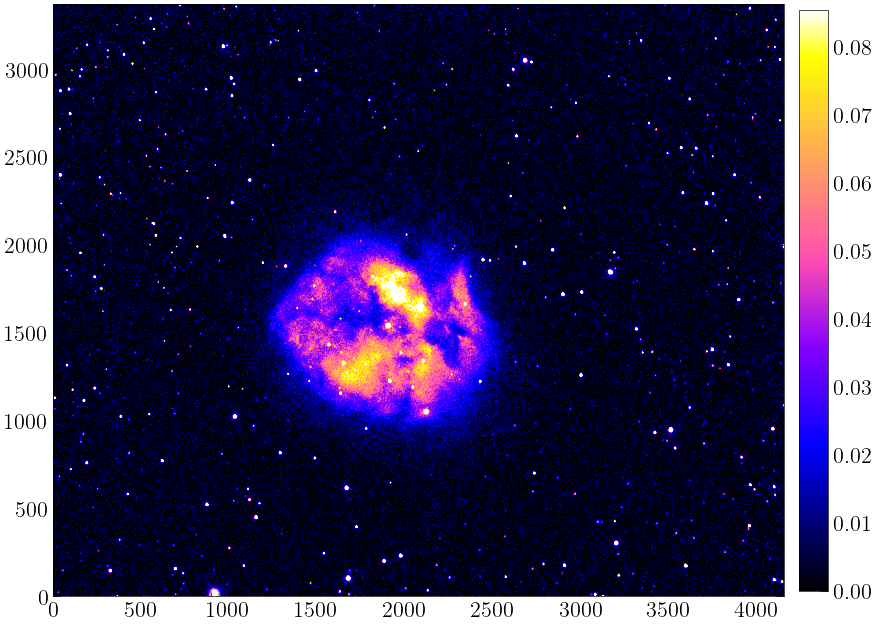

In [4]:
final_Ha = Open_Fits(filepath='Data/final_Ha.fits', plot=True)

In [5]:
final_Ha_radec = fits.open('Data/final_Ha_radec.fits')[1].data
final_Ha_radec

FITS_rec([(328.6532846 , 47.15560772,  921.82434 , 1.74548531e+01, 3.45572052e+01, 0.00260925),
          (328.37017436, 47.26660542, 1907.9147  , 1.53818115e+03, 9.16756153e+00, 0.04750919),
          (328.12018925, 47.38700367, 2686.7764  , 3.04577710e+03, 7.69480991e+00, 0.0024128 ),
          (328.37558545, 47.2012023 , 2125.0745  , 1.04945142e+03, 6.86020613e+00, 0.02323532),
          (328.1420862 , 47.22878445, 3172.8506  , 1.84244763e+03, 6.70983076e+00, 0.00212526),
          (328.16143343, 47.1119084 , 3515.8984  , 9.45524536e+02, 4.97167635e+00, 0.0022378 ),
          (328.39010883, 47.49197238,  970.0183  , 3.12536255e+03, 3.22498703e+00, 0.00243759),
          (328.33571165, 47.44714909, 1404.0621  , 2.93674268e+03, 1.34269893e+00, 0.0023849 ),
          (328.52438474, 47.12269255, 1681.8555  , 1.02863037e+02, 5.45206022e+00, 0.00224209),
          (328.55278954, 47.25886365, 1036.0205  , 1.02124268e+03, 3.96849036e+00, 0.00243831),
          (328.26415876, 47.05925134, 32

In [6]:
print(np.min(final_Ha_radec['ra']), np.max(final_Ha_radec['ra']))
print(np.min(final_Ha_radec['dec']), np.max(final_Ha_radec['dec']))

327.861475729151 328.7958090865958
46.9823001142356 47.5606852155633


In [7]:
# magnitudes between 14.5 and 15.5
SDSS_catalogue = fits.open('Data/SDSS_catalogue_15_16.fit')[1].data
SDSS_catalogue

FITS_rec([(328.58057361, 46.98690832, 328.580579, 46.986901, 1, '', 6, 'J215419.33+465912.8', '', 2006.394, 3, 17.159, 0.009, 15.681, 0.003, 15.105, 0.003, 14.919, 0.004, 14.751, 0.005, 0.0, 0.0, 0.0, 0.0),
          (328.42941082, 46.98918789, 328.429424, 46.989194, 1, '+', 6, 'J215343.06+465921.0', '*', 2006.394, 3, 17.328, 0.01, 15.886, 0.003, 15.256, 0.003, 14.974, 0.004, 14.82, 0.005, 0.0, 0.0, 0.0, 0.0),
          (328.43438273, 46.99230979, 328.434395, 46.992307, 1, '+', 6, 'J215344.25+465932.3', '', 2006.394, 3, 17.388, 0.01, 15.982, 0.003, 15.368, 0.003, 15.092, 0.004, 14.942, 0.005, 0.0, 0.0, 0.0, 0.0),
          (328.49950121, 46.9958261, 328.499434, 46.995823, 1, '+', 6, 'J215359.86+465944.9', '', 2006.394, 3, 17.341, 0.01, 15.865, 0.003, 15.232, 0.003, 14.918, 0.004, 14.739, 0.005, 0.0, 0.0, 0.0, 0.0),
          (328.55587919, 47.01212553, 328.555905, 47.012129, 1, '', 3, 'J215413.41+470043.6', '', 2006.394, 3, 17.272, 0.01, 15.752, 0.003, 15.176, 0.003, 14.931, 0.004, 14.

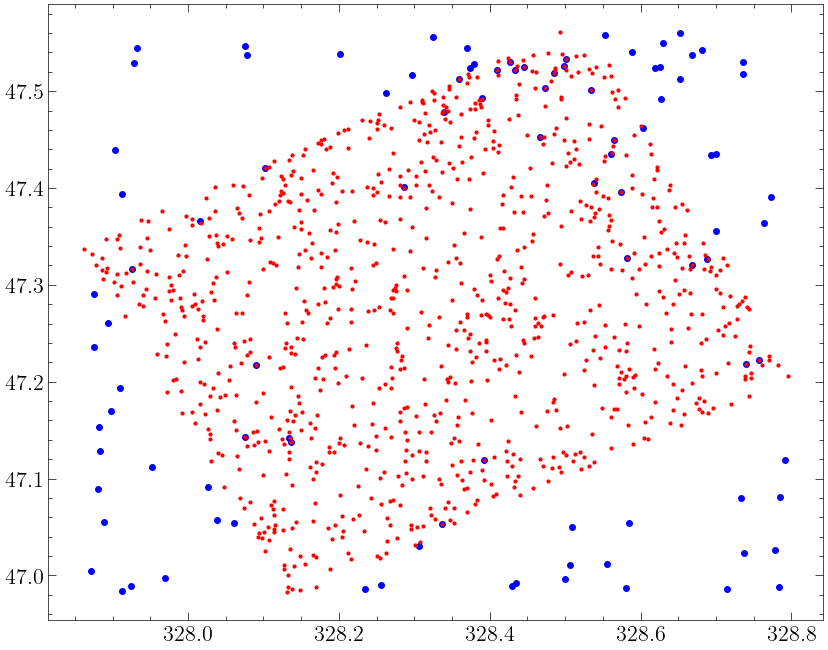

In [8]:
for i in range(len(SDSS_catalogue['_RAJ2000'])):
    plt.plot(SDSS_catalogue['_RAJ2000'][i], SDSS_catalogue['_DEJ2000'][i], c='blue', marker='o', markersize=4)

for i in range(len(final_Ha_radec['ra'])):
    plt.plot(final_Ha_radec['ra'][i], final_Ha_radec['dec'][i], c='red', marker='o', markersize=2)

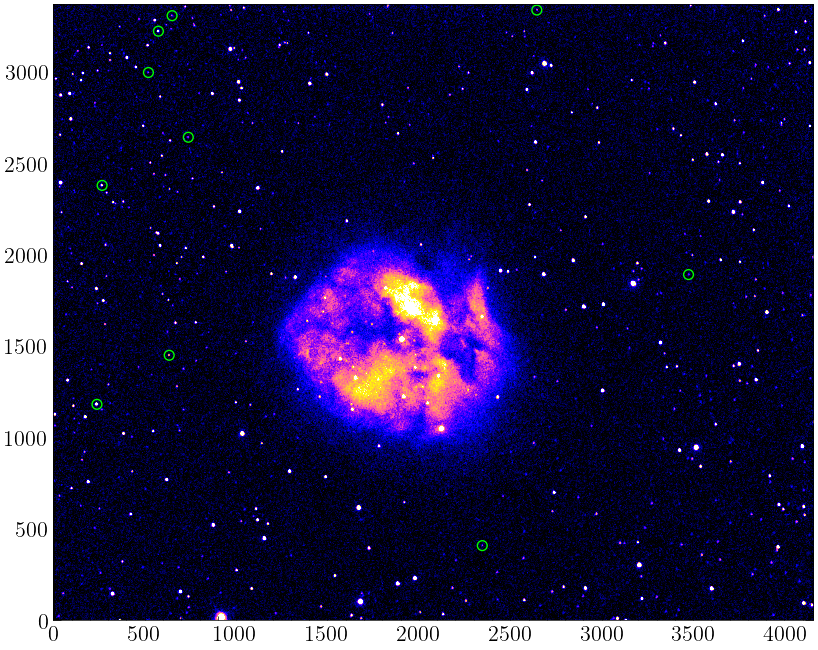

In [9]:
stars_x = []
stars_y = []
stars_gmag = []
stars_rmag = []
stars_imag = []
stars_ra = []   # useless in this code, but can be used to identify the star at https://skyserver.sdss.org/dr18/VisualTools/navi/
stars_dec = []  # ...

for i in range(len(SDSS_catalogue['_RAJ2000'])):
    # Find the matches between SDSS stars and our stars
    mask_ra = np.isclose(final_Ha_radec['ra'], SDSS_catalogue['_RAJ2000'][i], atol=0, rtol=0.0000005)
    mask_dec = np.isclose(final_Ha_radec['dec'], SDSS_catalogue['_DEJ2000'][i], atol=0, rtol=0.0000005)
    mask_tot = np.logical_and(mask_ra, mask_dec)
    
    # If there is only one match, append the coordinates (from astrometry.net) and magnitudes (from SDSS catalogue)
    # If there is no match or more than one match, do nothing
    if np.sum(mask_tot) == 1:
        stars_x.append(final_Ha_radec['x'][mask_tot][0])
        stars_y.append(final_Ha_radec['y'][mask_tot][0])
        stars_gmag.append(SDSS_catalogue['gmag'][i])
        stars_rmag.append(SDSS_catalogue['rmag'][i])
        stars_imag.append(SDSS_catalogue['imag'][i])
        stars_ra.append(SDSS_catalogue['_RAJ2000'][i])
        stars_dec.append(SDSS_catalogue['_DEJ2000'][i])
        
stars_x = np.array(stars_x)
stars_y = np.array(stars_y)
stars_gmag = np.array(stars_gmag)
stars_rmag = np.array(stars_rmag)
stars_imag = np.array(stars_imag)
stars_ra = np.array(stars_ra)
stars_dec = np.array(stars_dec)
        
plt.imshow(final_Ha, clim=(0, np.quantile(final_Ha, [0.99])), cmap='gnuplot2', origin='lower')

for i in range(len(stars_x)):
    plt.scatter(stars_x[i], stars_y[i], facecolors='none', edgecolors='lime', s=50)

In [10]:
def Aperture_Photometry(image, stars_x, stars_y, stars_ra, stars_dec, rectangle_side=40):
    ourfluxes = []

    fig, ax = plt.subplots(figsize=(18,12))
    ax.imshow(image, clim=(0, np.quantile(image, [0.99])), cmap='gnuplot2', origin='lower')

    for i in range(len(stars_x)):
        # Determine the centroids of the stars (more accurate than the astrometry.net ones)
        cutout = image[round(stars_y[i])-round(rectangle_side/2):round(stars_y[i])+round(rectangle_side/2), round(stars_x[i])-round(rectangle_side/2):round(stars_x[i])+round(rectangle_side/2)]
        centroid = centroid_com(cutout)+[round(stars_x[i])-round(rectangle_side/2), round(stars_y[i])-round(rectangle_side/2)]

        if np.isnan(centroid).any() == True:
            print('The centroid algorithm returned NaN. The corresponding star will have a NaN flux.')
            ourfluxes.append(np.nan)
            continue
        
        rectangle_plot = plt.Rectangle(centroid-[round(rectangle_side/2),round(rectangle_side/2)], rectangle_side, rectangle_side, linewidth=0.8, color='lime', fill=False)
        ax.add_patch(rectangle_plot)
        ax.text(centroid[0]+rectangle_side, centroid[1]-0.5*rectangle_side, f'{i}', fontsize=15, color='lime')

        # Compute the FWHM of the stars to decide the radius of the circular aperture
        cutout = image[round(centroid[1])-round(rectangle_side/2):round(centroid[1])+round(rectangle_side/2), round(centroid[0])-round(rectangle_side/2):round(centroid[0])+round(rectangle_side/2)]
        x_projection = np.mean(cutout, axis=0)
        x_fit = np.arange(len(x_projection))
        gaussian = models.Gaussian1D(amplitude=np.max(x_projection), mean=len(x_projection)/2, stddev=len(x_projection)/10)
        fit_gaussian = fitting.LevMarLSQFitter()
        fitted_gaussian = fit_gaussian(gaussian, x_fit, x_projection)
        fwhm = 2.355*fitted_gaussian.stddev
        
        plt.figure(figsize=(6,4))
        plt.title(f'Star {i} ({stars_ra[i]:.4f}, {stars_dec[i]:.4f})')
        plt.plot(x_projection, label='Data')
        plt.plot(x_fit, fitted_gaussian(x_fit), label='Fit')
        plt.axhline(0, c='black', linestyle='--', alpha=0.5, zorder=0)
        plt.axvline(fitted_gaussian.mean-0.5*3*fwhm, c='red', linestyle='--')
        plt.axvline(fitted_gaussian.mean+0.5*3*fwhm, c='red', linestyle='--')
        plt.legend();
        

        # Compute the flux of the stars
        aperture = CircularAperture(centroid, r=3*fwhm)
        ourfluxes.append(aperture_photometry(image, aperture)['aperture_sum'][0])
    
    return np.array(ourfluxes)

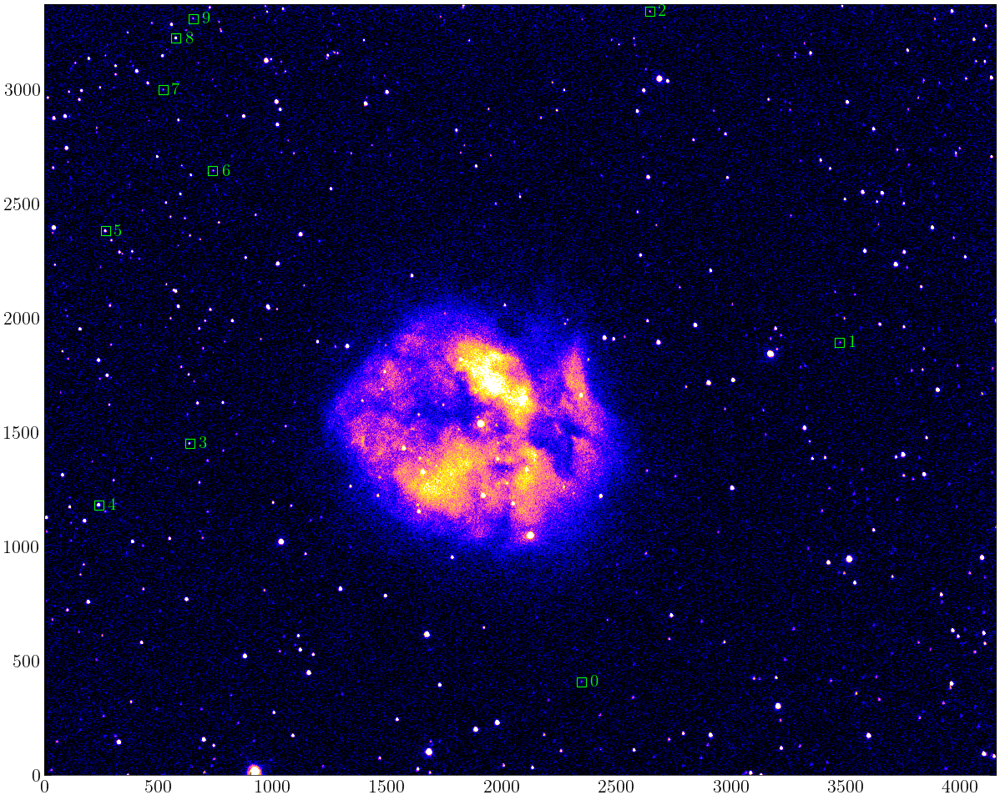

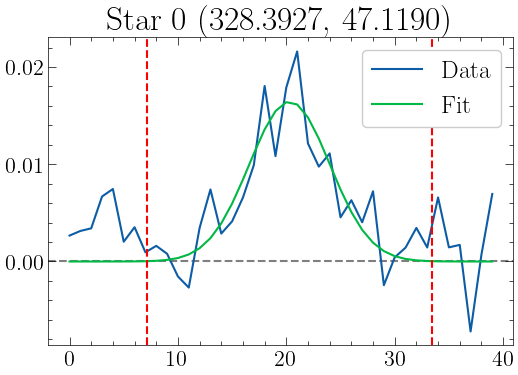

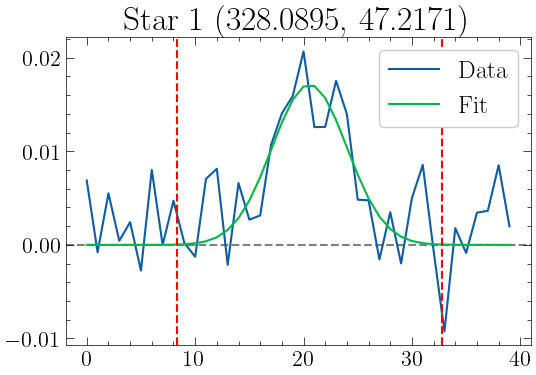

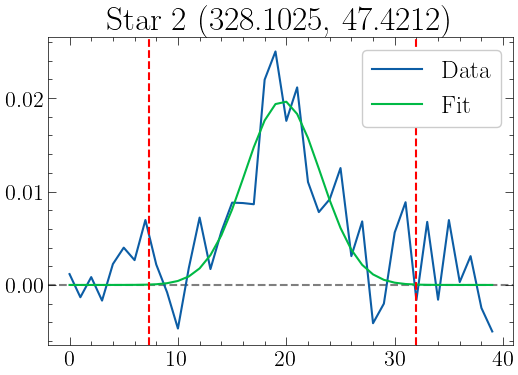

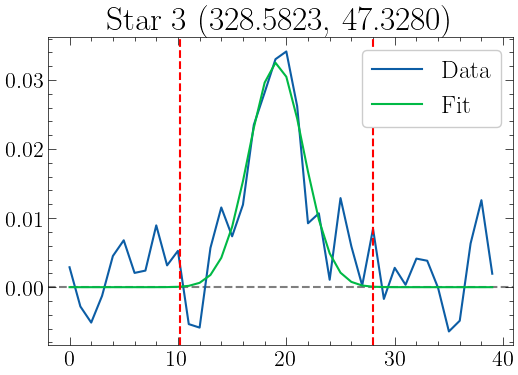

...

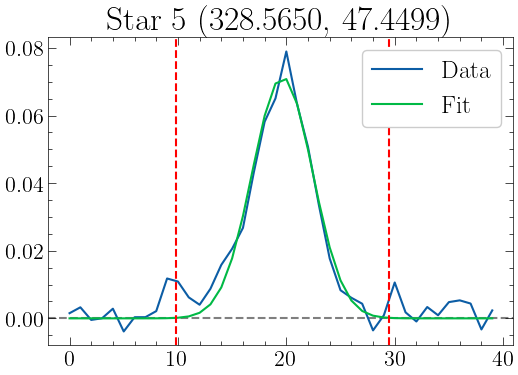

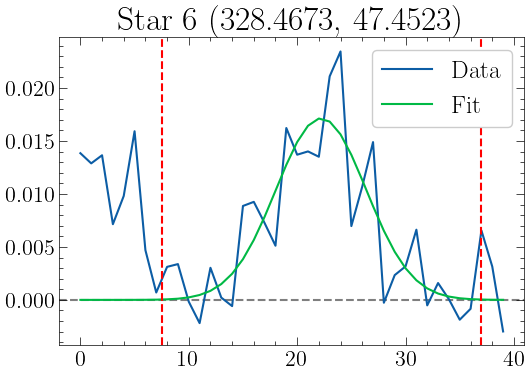

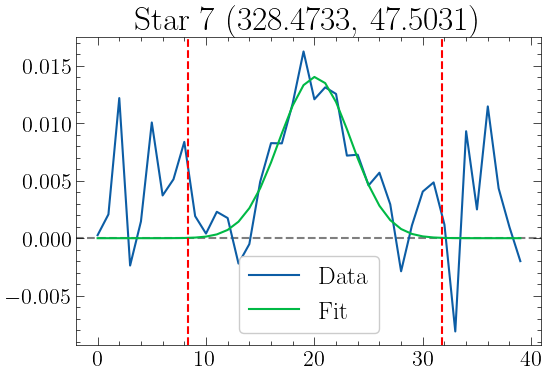

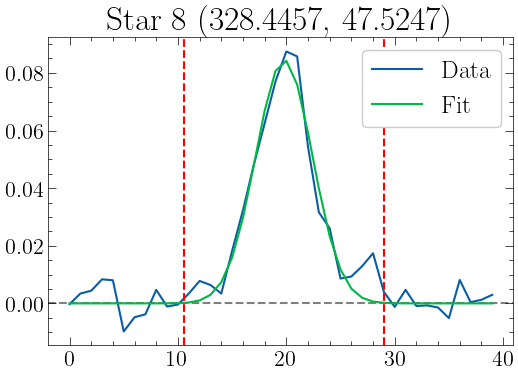

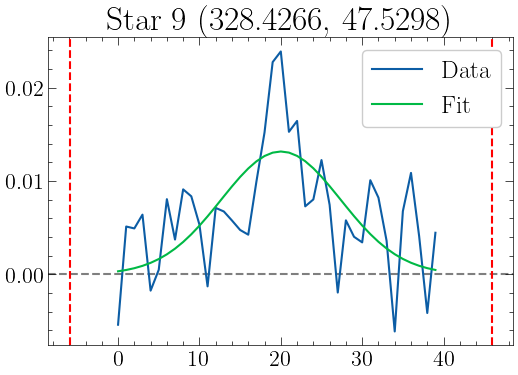

In [11]:
ourfluxes_Ha = Aperture_Photometry(final_Ha, stars_x, stars_y, stars_ra, stars_dec)

In [12]:
truefluxes_Ha = np.array(stars_rmag) - 0.2568 * (np.array(stars_gmag)-np.array(stars_rmag)) + 0.1470
ZP_array = truefluxes_Ha - ourfluxes_Ha
ZP_array

array([  5.56940553,   6.4172246 ,   4.72178745,   6.10570594,
       -38.05896313,  -7.45218982,   1.14906134,   7.64313123,
        -8.07460416, -19.55199835])

In [13]:
print('our fluxes' , '\t\t', 'true fluxes')
for i in range(len(ourfluxes_Ha)):
    print(ourfluxes_Ha[i] , '\t', truefluxes_Ha[i])

our fluxes 		 true fluxes
9.509477666954886 	 15.0788832
8.72220259687576 	 15.1394272
10.21229815239813 	 14.9340856
9.574898059964006 	 15.680604
53.06672312721186 	 15.007760000000001
22.61333462356958 	 15.1611448
13.929253863638223 	 15.078315200000002
7.416970366540302 	 15.060101600000001
23.331765762724466 	 15.257161599999998
34.826767149626704 	 15.2747688


In [14]:
ZP_Ha = ZeroPoint('Ha', ourfluxes_Ha, stars_rmag, stars_gmag, stars_imag)
ZP_Ha

-4.153143936950391

# Filter Hb

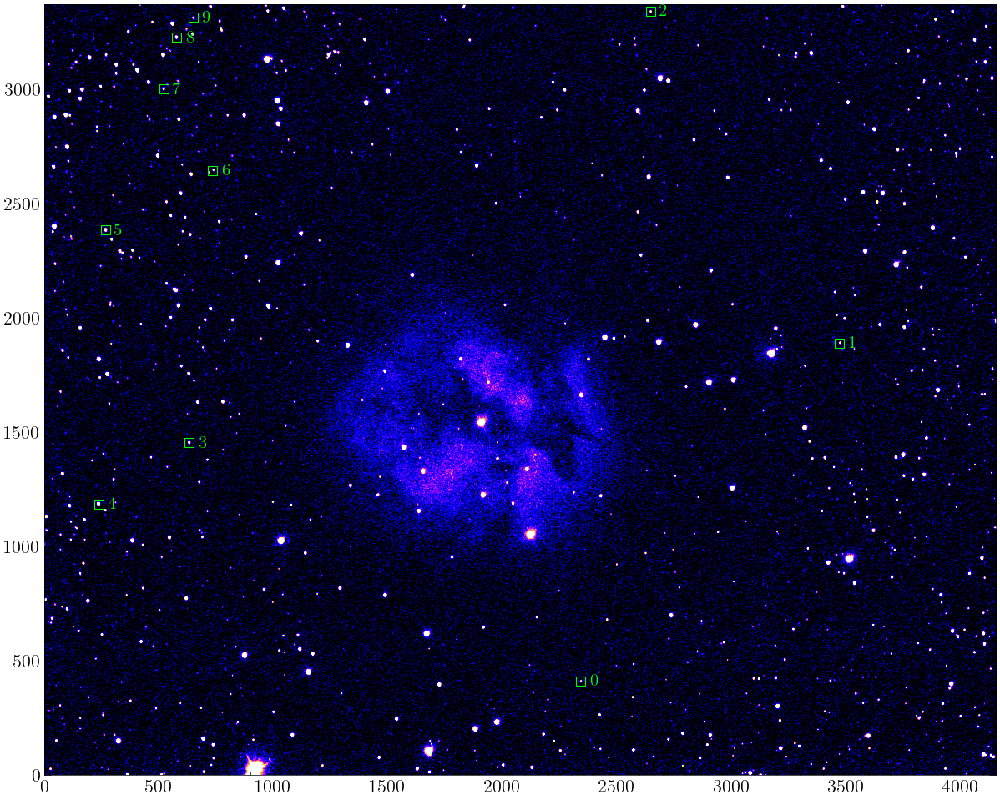

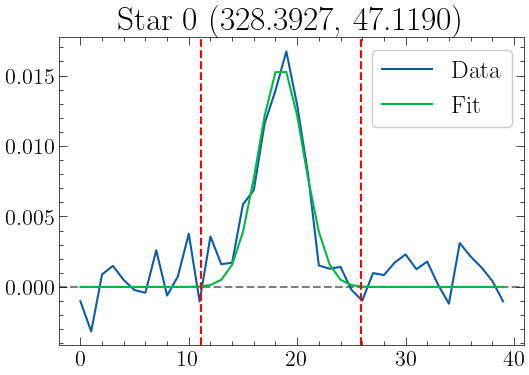

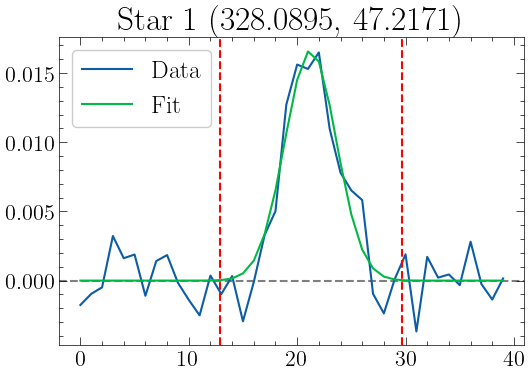

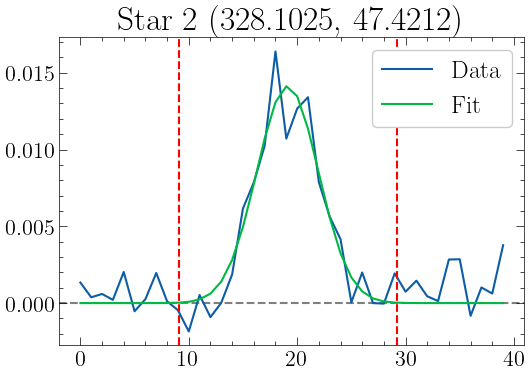

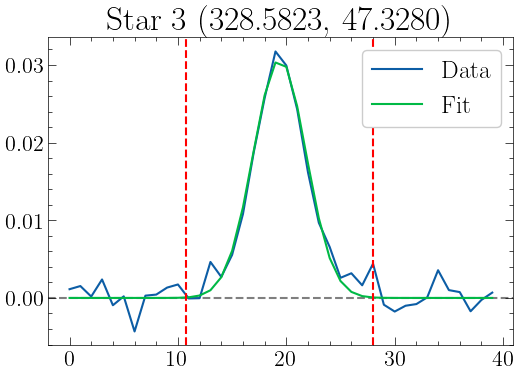

...

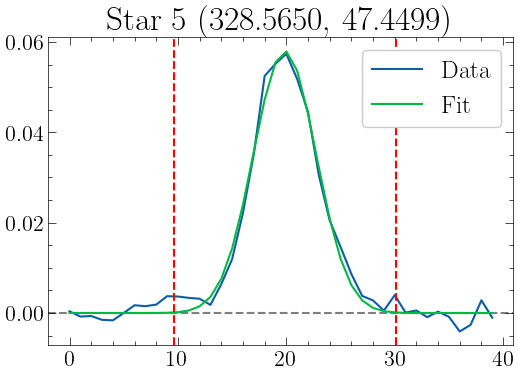

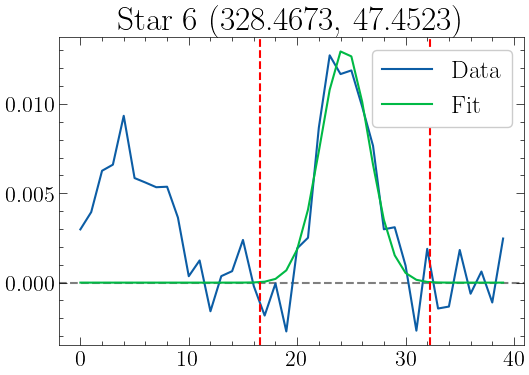

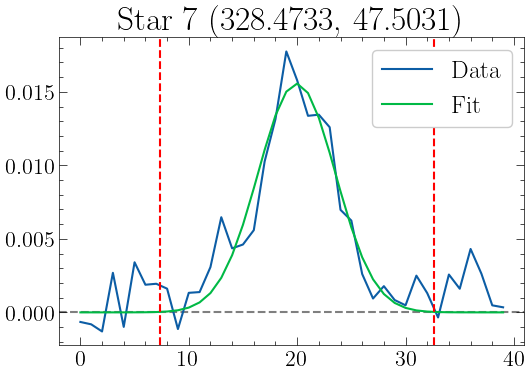

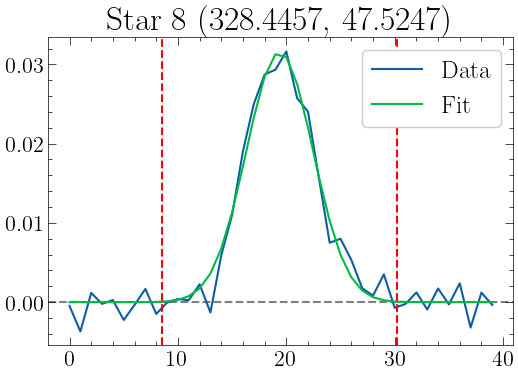

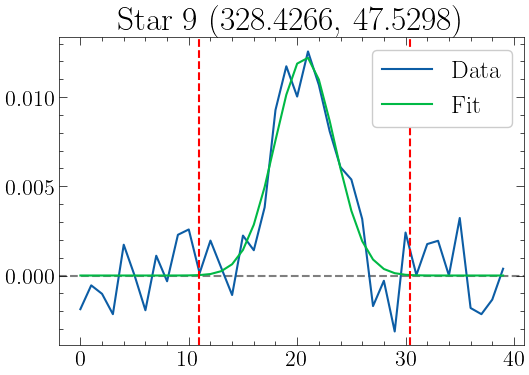

In [15]:
final_Hb = Open_Fits(filepath='Data/final_Hb.fits', plot=False)

ourfluxes_Hb = Aperture_Photometry(final_Hb, stars_x, stars_y, stars_ra, stars_dec)

In [16]:
truefluxes_Hb = np.array(stars_gmag) - 0.2322 * (np.array(stars_gmag)-np.array(stars_rmag)) - 0.0024
ZP_array = truefluxes_Hb - ourfluxes_Hb
ZP_array

array([ 11.90558062,  12.11911033,  11.42917732,   7.65869683,
       -10.98868587,  -2.08662237,  12.24266392,   8.79128774,
         6.17927508,  12.21585031])

In [17]:
print('our fluxes' , '\t\t', 'true fluxes')
for i in range(len(ourfluxes_Hb)):
    print(ourfluxes_Hb[i] , '\t', truefluxes_Hb[i])

our fluxes 		 true fluxes
3.8702221766756955 	 15.775802800000001
3.635268473975866 	 15.7543788
4.209000079702175 	 15.6381774
7.969844170531184 	 15.628541
26.410575869842944 	 15.42189
17.189556567735025 	 15.1029342
3.5428168817626378 	 15.7854808
6.593803659313311 	 15.3850914
9.582181319104116 	 15.7614564
3.584729893444425 	 15.8005802


In [18]:
ZP_Hb = ZeroPoint('Hb', ourfluxes_Hb, stars_rmag, stars_gmag, stars_imag)
ZP_Hb

6.946633390791263

# Filter g

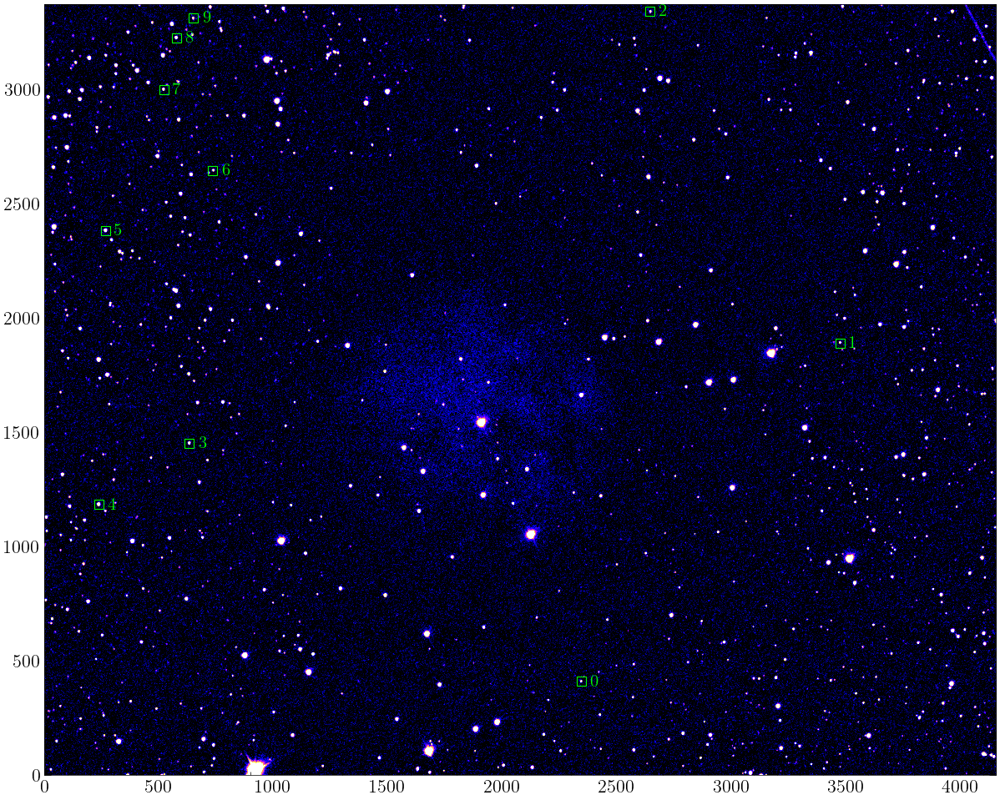

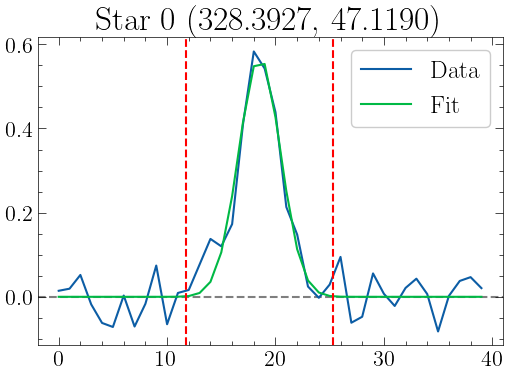

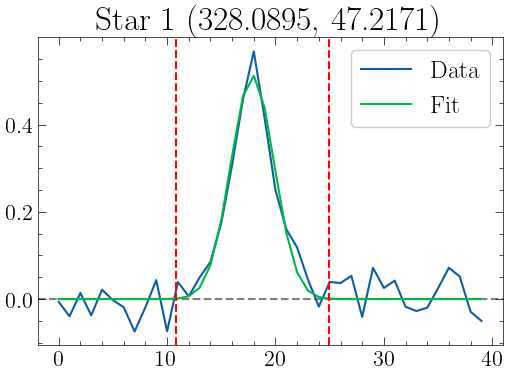

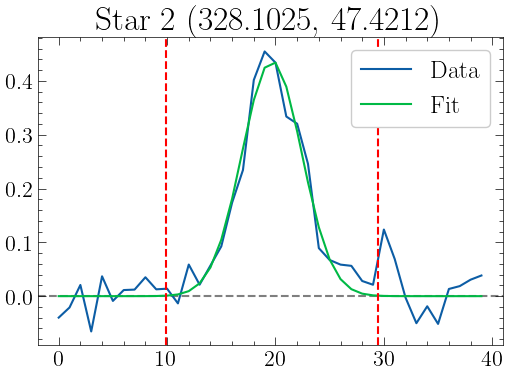

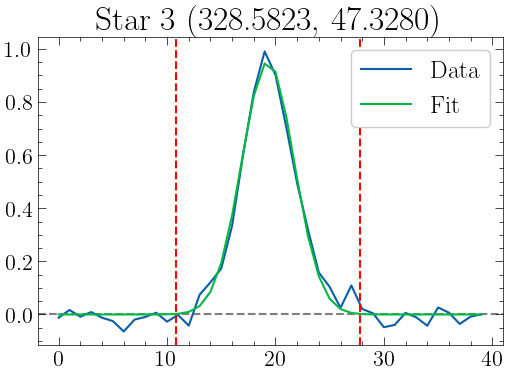

...

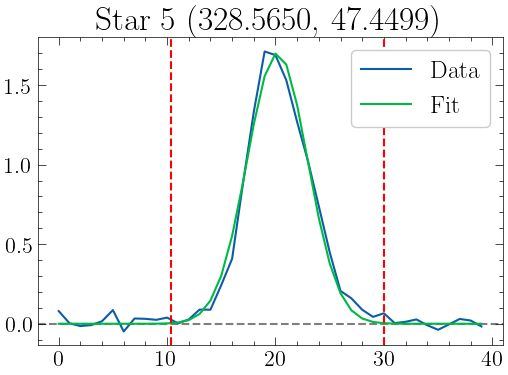

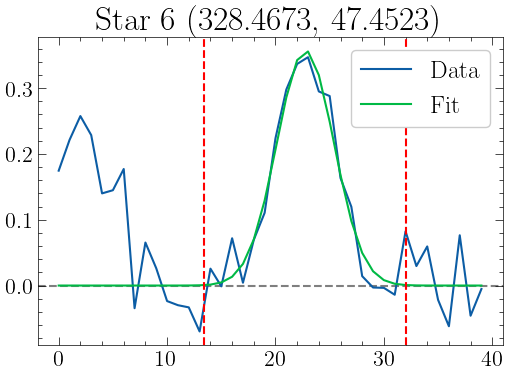

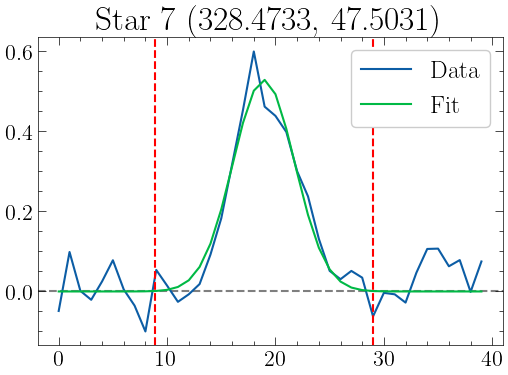

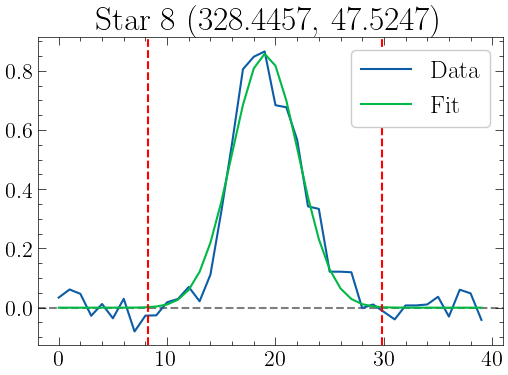

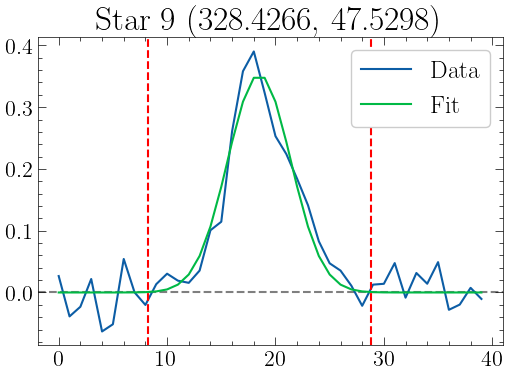

In [19]:
final_g = Open_Fits(filepath='Data/final_g.fits', plot=False)

ourfluxes_g = Aperture_Photometry(final_g, stars_x, stars_y, stars_ra, stars_dec)

In [20]:
truefluxes_g = np.array(stars_gmag) - 0.1205 * (np.array(stars_gmag)-np.array(stars_rmag)) + 0.0012
ZP_array = truefluxes_g - ourfluxes_g
ZP_array

array([-101.31340232,  -97.06051741, -113.75157064, -216.67060385,
       -728.36627011, -469.62883713,  -99.9943692 , -138.03564081,
       -246.89551987,  -97.18810329])

In [21]:
print('our fluxes' , '\t\t', 'true fluxes')
for i in range(len(ourfluxes_g)):
    print(ourfluxes_g[i] , '\t', truefluxes_g[i])

our fluxes 		 true fluxes
117.18506932070272 	 15.871667000000002
112.90182441328619 	 15.841307
129.48639413552058 	 15.734823500000001
232.3133563540501 	 15.6427525
743.8531951089079 	 15.486925000000001
484.74531263035044 	 15.1164755
115.87683120147423 	 15.882462
153.476049311773 	 15.4404085
262.73184086757095 	 15.836321000000002
113.06589379364917 	 15.8777905


In [22]:
ZP_g = ZeroPoint('g', ourfluxes_g, stars_rmag, stars_gmag, stars_imag)
ZP_g

-230.89048346372846

# Filter r

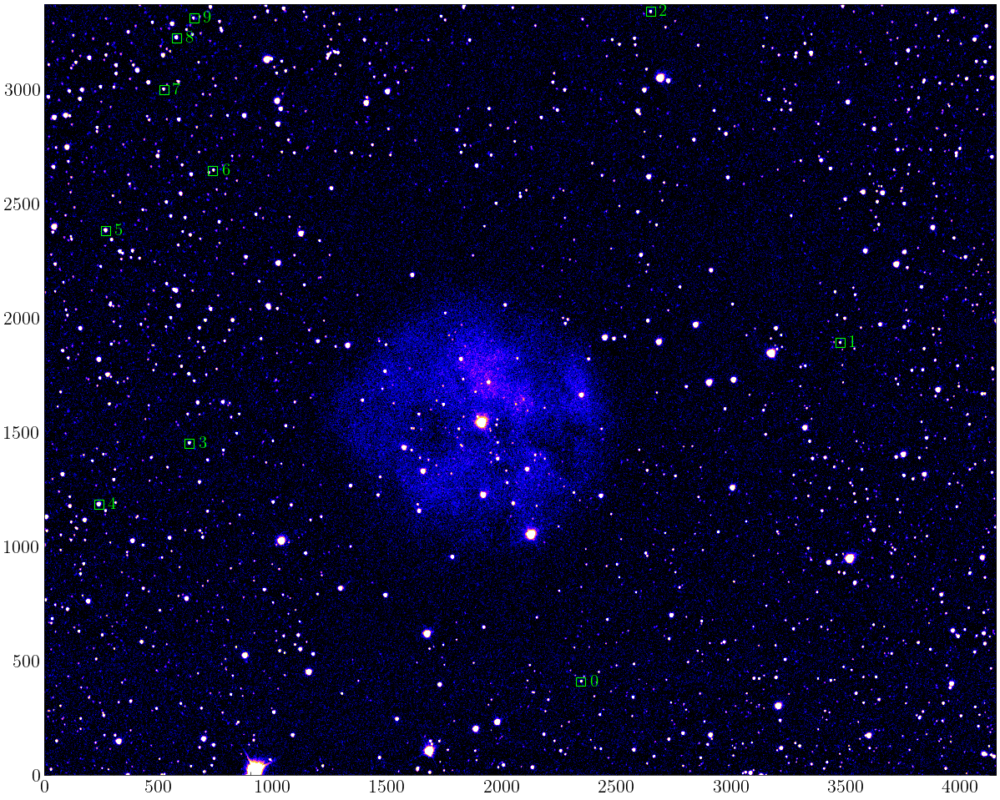

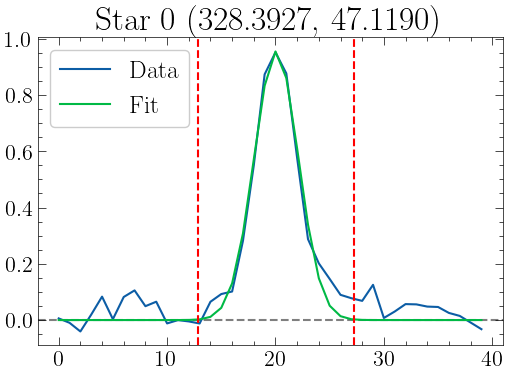

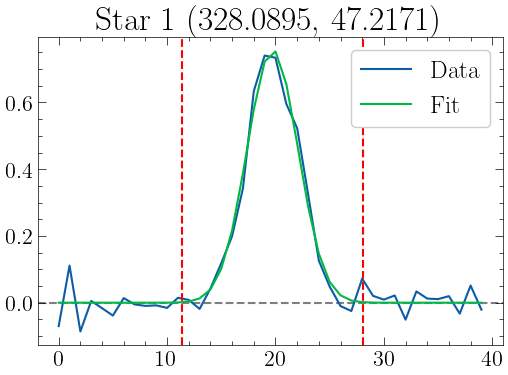

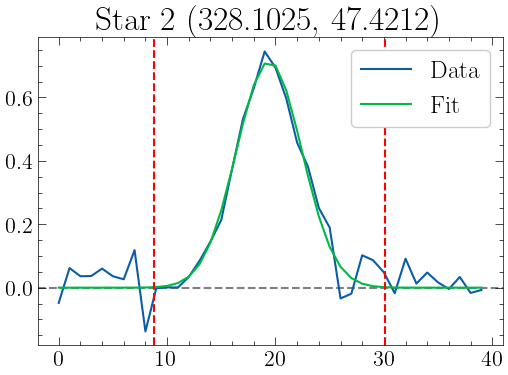

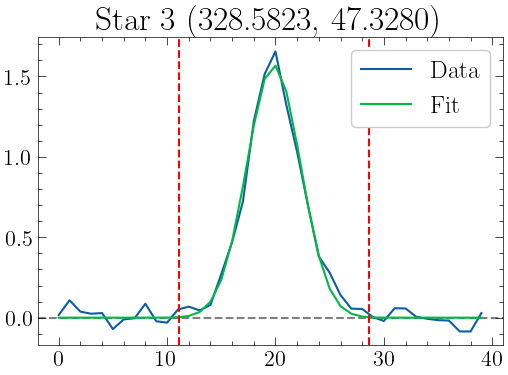

...

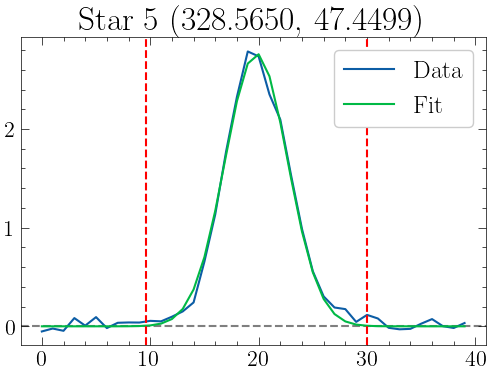

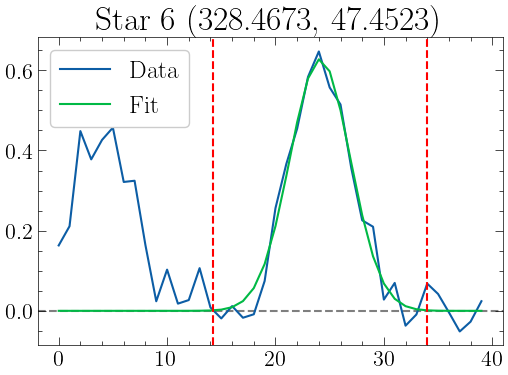

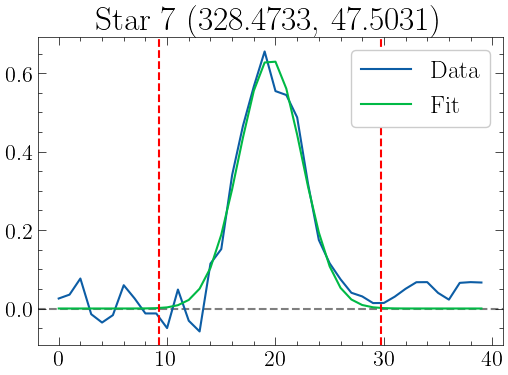

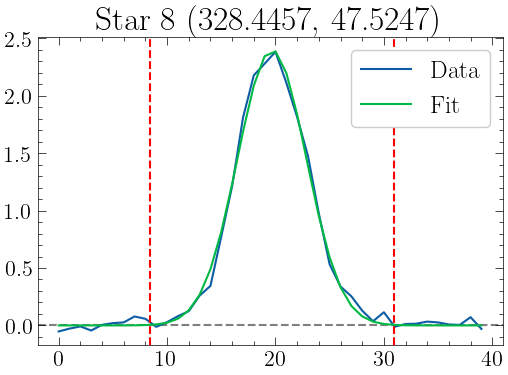

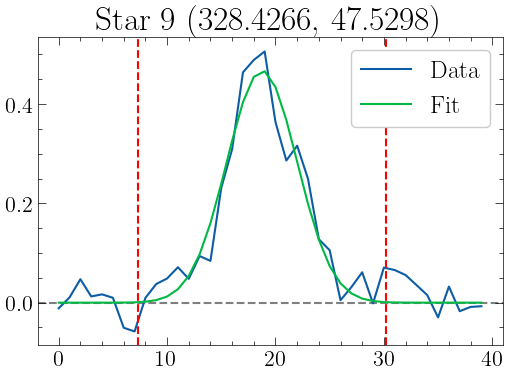

In [23]:
final_r = Open_Fits(filepath='Data/final_r.fits', plot=False)

ourfluxes_r = Aperture_Photometry(final_r, stars_x, stars_y, stars_ra, stars_dec)

In [24]:
truefluxes_r = np.array(stars_gmag) - 0.0061 * (np.array(stars_gmag)-np.array(stars_rmag)) + 0.0001
ZP_array = truefluxes_r - ourfluxes_r
ZP_array

array([ -193.86411404,  -158.58094181,  -211.31350194,  -396.0181813 ,
       -1877.21717644,  -812.65022414,  -245.47731688,  -170.57643228,
        -761.36391127,  -152.24104639])

In [25]:
print('our fluxes' , '\t\t', 'true fluxes')
for i in range(len(ourfluxes_r)):
    print(ourfluxes_r[i] , '\t', truefluxes_r[i])

our fluxes 		 true fluxes
209.8291754413891 	 15.9650614
174.50649120702315 	 15.9255494
227.14252064146217 	 15.829018699999999
411.6707018042231 	 15.6525205
1892.7659214391133 	 15.548745
827.775781237912 	 15.1255571
261.4543172793984 	 15.9770004
186.06870797527182 	 15.492275699999999
777.2721194706912 	 15.9082082
168.19312648762508 	 15.9520801


In [26]:
ZP_r = ZeroPoint('r', ourfluxes_r, stars_rmag, stars_gmag, stars_imag)
ZP_r

-498.50378464841094

# Filter i

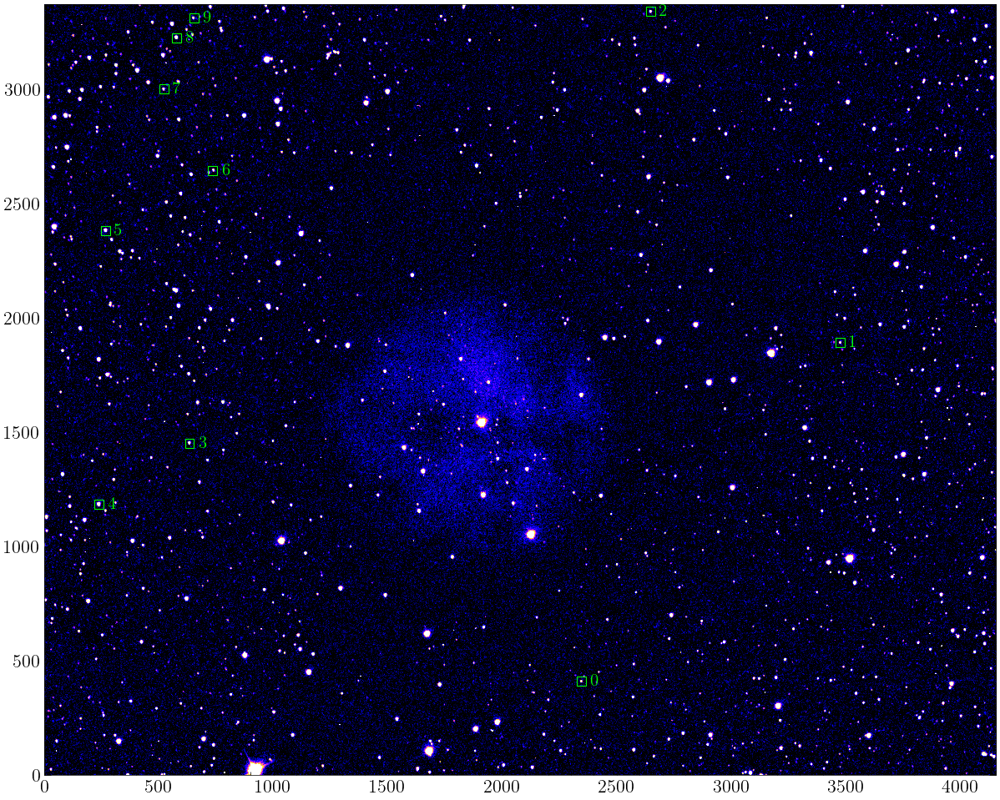

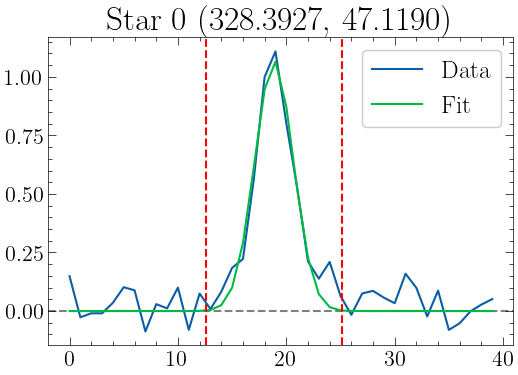

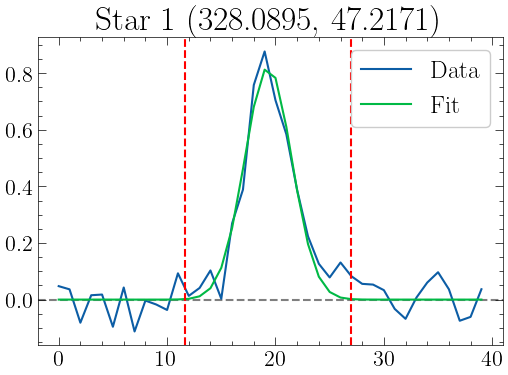

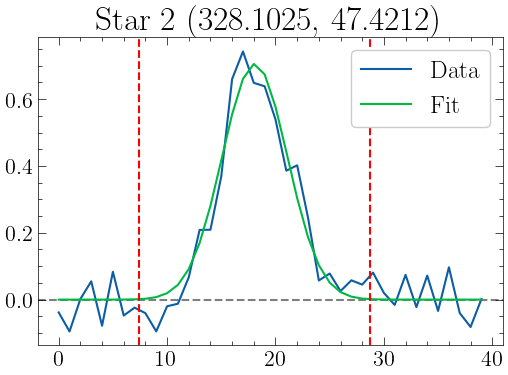

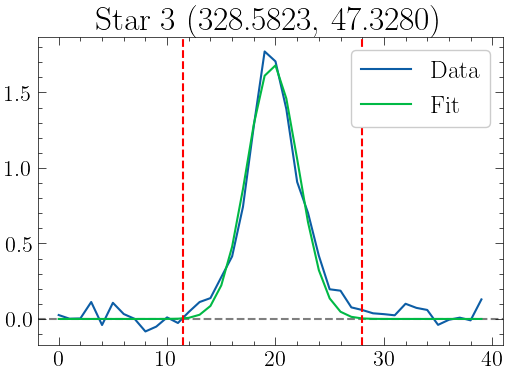

...

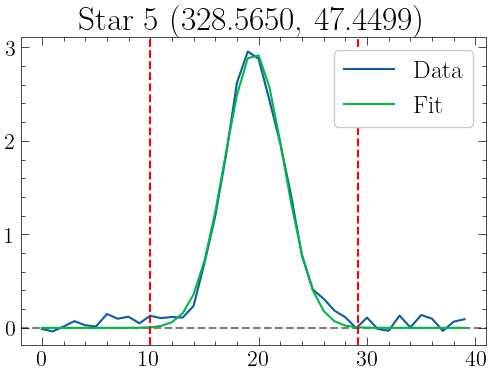

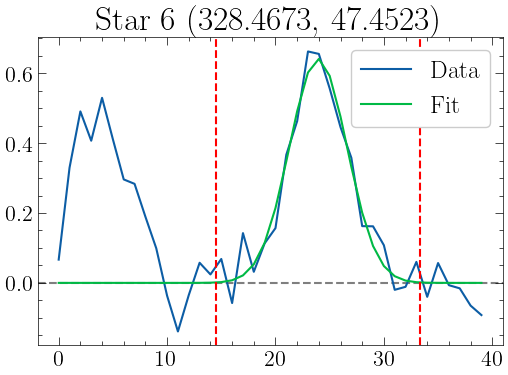

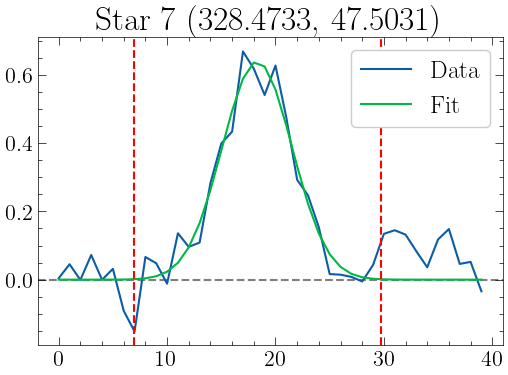

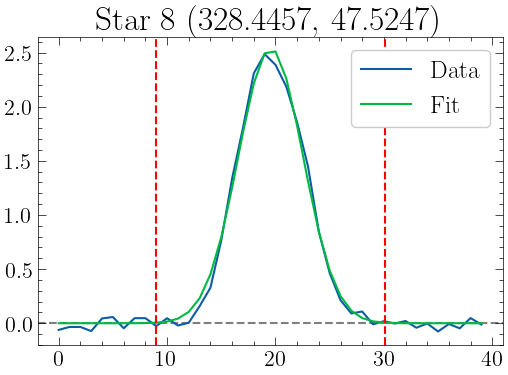

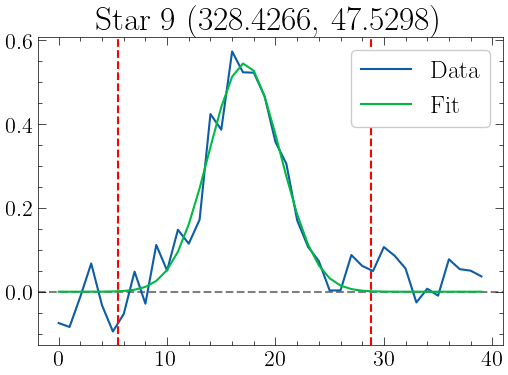

In [27]:
final_i = Open_Fits(filepath='Data/final_i.fits', plot=False)

ourfluxes_i = Aperture_Photometry(final_i, stars_x, stars_y, stars_ra, stars_dec)

In [28]:
truefluxes_i = np.array(stars_imag) - 0.0609 * (np.array(stars_rmag)-np.array(stars_imag)) + 0.0049
ZP_array = truefluxes_i - ourfluxes_i
ZP_array

array([ -190.16187954,  -181.36804021,  -198.78619152,  -404.54773938,
       -1898.8194878 ,  -828.47516447,  -221.48672053,  -231.54871957,
        -731.92320221,  -187.01708627])

In [29]:
print('our fluxes' , '\t\t', 'true fluxes')
for i in range(len(ourfluxes_i)):
    print(ourfluxes_i[i] , '\t', truefluxes_i[i])

our fluxes 		 true fluxes
204.88535864479613 	 14.723479099999999
196.20684320675738 	 14.838802999999999
213.37091421791166 	 14.584722699999999
418.83543757678495 	 14.2876982
1912.5384551969494 	 13.718967399999999
842.3320391722559 	 13.856874699999999
236.25039202552023 	 14.7636715
246.4190582677975 	 14.8703387
745.7041114111405 	 13.7809092
202.02829967197977 	 15.011213399999999


In [30]:
ZP_i = ZeroPoint('i', ourfluxes_i, stars_rmag, stars_gmag, stars_imag)
ZP_i

-507.4134231491894

# Science?

$ \mathrm{flux}_{\mathrm{H}\alpha}/\mathrm{flux}_{\mathrm{H}\beta} \approx 2.86^{+0.18}_{-0.11} $

$D = \frac{f_{\mathrm{H}\alpha}}{f_{\mathrm{H}\beta}} - 2.9 = (R_\alpha / R_\beta) 10^{-0.4(ZP_{\alpha} - ZP_{\beta})} - 2.9$  Minimo X>0.2 perché abbia qualche senso

Area nebulosa divisa in 3000 sezioni da 180 pixel, per noi sarebbero circa 450 pixel per sezione (Binning 0.0167 × 0.0167 × 0.0167 dex^3 ?)

https://www.aanda.org/articles/aa/full_html/2023/02/aa45072-22/aa45072-22.html